#Install Dependencies

_(Remember to choose GPU in Runtime if not already selected. Runtime --> Change Runtime Type --> Hardware accelerator --> GPU)_

In [2]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
!git reset --hard 886f1c03d839575afecb059accf74296fad395b6

Cloning into 'yolov5'...
remote: Enumerating objects: 12088, done.
remote: Counting objects: 100% (41/41), done.
remote: Compressing objects: 100% (34/34), done.
remote: Total 12088 (delta 21), reused 15 (delta 7), pack-reused 12047
Receiving objects: 100% (12088/12088), 11.90 MiB | 365.00 KiB/s, done.
Resolving deltas: 100% (8377/8377), done.
/home/bb/github/licence-plate-detection/yolov5/yolov5
HEAD is now at 886f1c0 DDP after autoanchor reorder (#2421)


In [15]:
# install dependencies as necessary
!pip install -r requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Defaulting to user installation because normal site-packages is not writeable
Setup complete. Using torch 1.11.0+cu102 CPU


# Download Correctly Formatted Custom Dataset 

We'll download our dataset from Roboflow. Use the "**YOLOv5 PyTorch**" export format. Note that the Ultralytics implementation calls for a YAML file defining where your training and test data is. The Roboflow export also writes this format for us.

To get your data into Roboflow, follow the [Getting Started Guide](https://blog.roboflow.ai/getting-started-with-roboflow/).



![YOLOv5 PyTorch export](https://i.imgur.com/5vr9G2u.png)


In [17]:
#follow the link below to get your download code from from Roboflow
!pip install -q roboflow
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="roboflow-yolov5")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=roboflow-yolov5


In [3]:

!pip install roboflow

from roboflow import Roboflow
# LICENCE PLATE ONLY
# rf = Roboflow(api_key="ShoUMicebMAd5m1XUjpZ")
# project = rf.workspace("emil-jahnke").project("licenseplates-mihfw")
# dataset = project.version(1).download("yolov5")

# LICENCE PLATES 2
rf = Roboflow(api_key="ShoUMicebMAd5m1XUjpZ")
project = rf.workspace("bechir-brahem").project("licence-plate-x032w")
dataset = project.version(2).download("yolov5")


Defaulting to user installation because normal site-packages is not writeable
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to licence-plate-2 in yolov5pytorch:: 100%|███████████████████████████████████████████████| 612/612 [00:00<00:00, 1536.13it/s]


In [4]:
%pwd

'/home/bb/github/licence-plate-detection'

In [5]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data

%cat {dataset.location}/data.yaml

names:
- licence
nc: 1
train: licence-plate-2/train/images
val: licence-plate-2/valid/images


# Define Model Configuration and Architecture

We will write a yaml script that defines the parameters for our model like the number of classes, anchors, and each layer.

You do not need to edit these cells, but you may.

In [6]:
# define number of classes based on YAML
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [9]:
%cd yolov5

/home/bb/github/licence-plate-detection/yolov5


In [10]:
#this is the model configuration we will use for our tutorial 
%cat models/yolov5s.yaml

# parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, C3, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C

In [11]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [13]:
%%writetemplate models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

# Train Custom YOLOv5 Detector

### Next, we'll fire off training!


Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive [folder](https://drive.google.com/open?id=1Drs_Aiu7xx6S-ix95f9kNsA6ueKRpN2J))
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 500 --data {dataset.location}/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

/content/yolov5
github: ⚠️ WARNING: code is out of date by 1091 commits. Use 'git pull' to update or 'git clone https://github.com/ultralytics/yolov5' to download latest.
YOLOv5 v4.0-126-g886f1c0 torch 1.11.0+cu113 CUDA:0 (Tesla T4, 15109.75MB)

Namespace(adam=False, batch_size=16, bucket='', cache_images=True, cfg='./models/custom_yolov5s.yaml', data='/content/yolov5/licence-plate-2/data.yaml', device='', entity=None, epochs=500, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[416, 416], linear_lr=False, local_rank=-1, log_artifacts=False, log_imgs=16, multi_scale=False, name='yolov5s_results', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/yolov5s_results2', single_cls=False, sync_bn=False, total_batch_size=16, weights='', workers=8, world_size=1)
wandb: Install Weights & Biases for YOLOv5 logging with 'pip install wandb' (recommended)
Start Tens

# Evaluate Custom YOLOv5 Detector Performance

Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the **--name** flag when we train. In our case, we named this `yolov5s_results`. (If given no name, it defaults to `results.txt`.) The results file is plotted as a png after training completes.

Note from Glenn: Partially completed `results.txt` files can be plotted with `from utils.utils import plot_results; plot_results()`.

In [16]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1265), started 0:00:35 ago. (Use '!kill 1265' to kill it.)

<IPython.core.display.Javascript object>

In [16]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason... 
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='runs/train/yolov5s_results2/results.png', width=1000)  # view results.png

FileNotFoundError: [Errno 2] No such file or directory: 'runs/train/yolov5s_results2/results.png'

### Curious? Visualize Our Training Data with Labels

After training starts, view `train*.jpg` images to see training images, labels and augmentation effects.

Note a mosaic dataloader is used for training (shown below), a new dataloading concept developed by Glenn Jocher and first featured in [YOLOv4](https://arxiv.org/abs/2004.10934).

GROUND TRUTH TRAINING DATA:


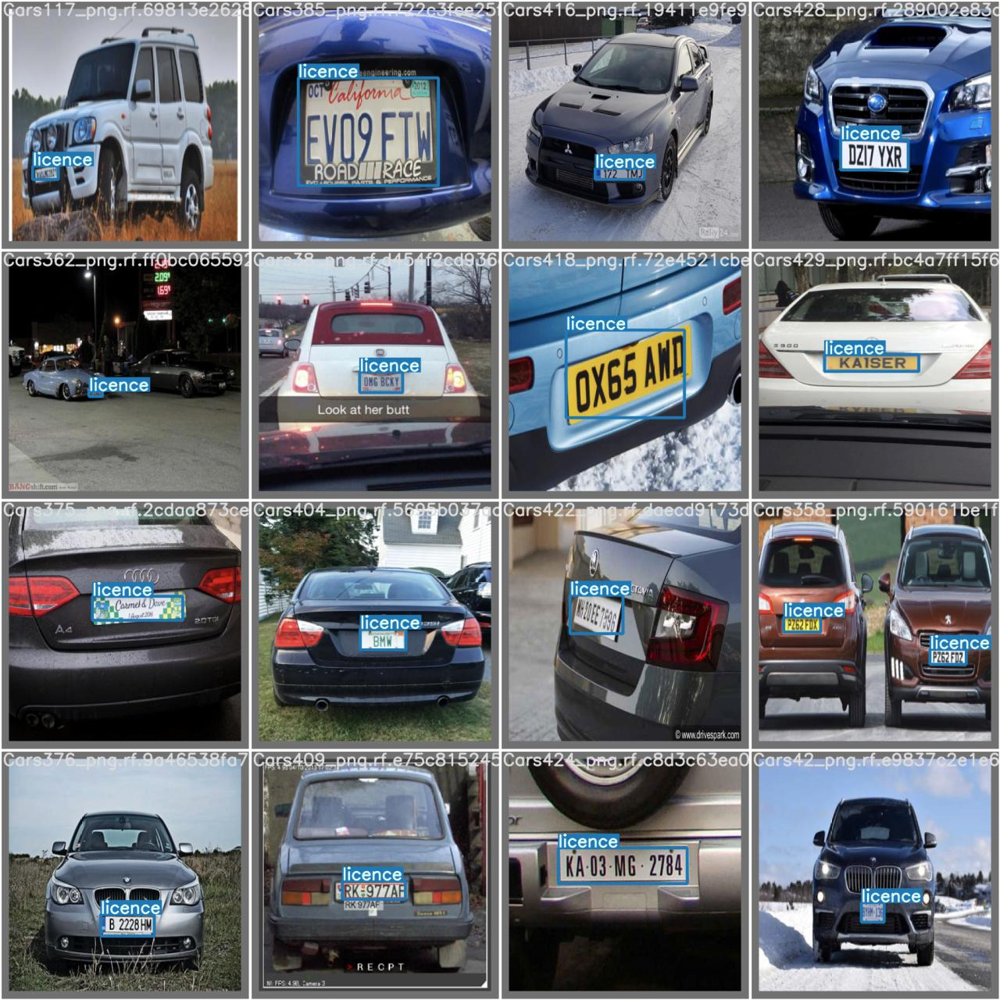

In [17]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results2/test_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


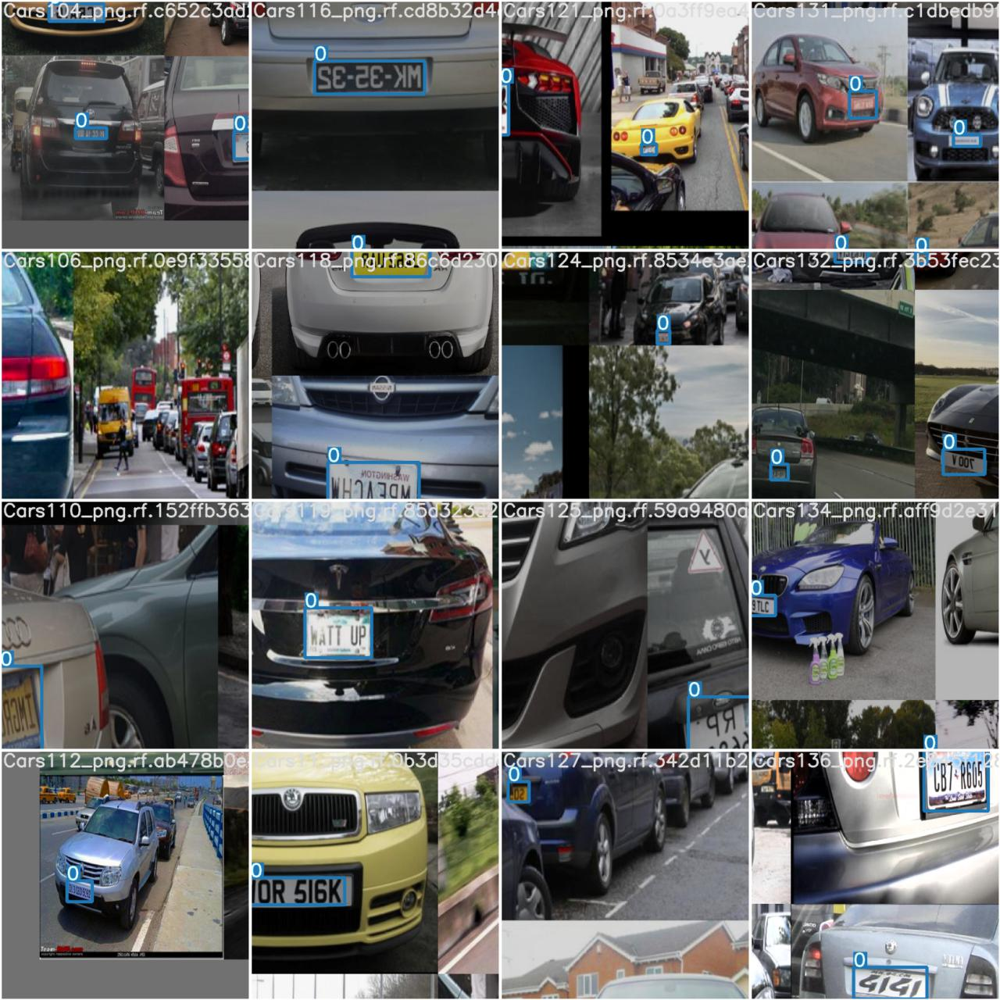

In [18]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results2/train_batch0.jpg', width=900)

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [19]:
# trained weights are saved by default in our weights folder
%ls runs/

train/


In [20]:
%ls runs/train/yolov5s_results8/weights

ls: cannot access 'runs/train/yolov5s_results8/weights': No such file or directory


In [32]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!

!python detect.py --weights ../best.pt --img 416 --conf 0.4 --source ../licence-plate-2/test/images --crop

Namespace(weights=['../best.pt'], source='../licence-plate-2/test/images', img_size=416, conf_thres=0.4, iou_thres=0.45, device='', view_img=False, save_txt=False, save_conf=False, classes=None, agnostic_nms=False, augment=False, update=False, project='runs/detect', name='exp', crop=True, exist_ok=False)
True
YOLOv5 v4.0-126-g886f1c0 torch 1.11.0+cu102 CPU

Fusing layers... 
Model Summary: 232 layers, 7246518 parameters, 0 gradients
/home/bb/.local/lib/python3.10/site-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
image 1/32 /home/bb/github/licence-plate-detection/yolov5/../licence-plate-2/test/images/Cars100_png.rf.9be1072947c9358d849dfa12498a9468.jpg: 416x416 Done. (0.171s)
There is no detected object
image 2/32 /home/bb/github/licence-plate-detection/y

image 31/32 /home/bb/github/licence-plate-detection/yolov5/../licence-plate-2/test/images/Cars94_png.rf.2d080ad612b35a8d44315dcbf437c4a5.jpg: 416x416 2 licences, Done. (0.247s)
test_images/results/Cars94_png.rf.2d080ad612b35a8d44315dcbf437c4a5.jpg
test_images/results/Cars94_png.rf.2d080ad612b35a8d44315dcbf437c4a5.jpg
image 32/32 /home/bb/github/licence-plate-detection/yolov5/../licence-plate-2/test/images/Cars96_png.rf.bb03c472d120bd3e68bd088b66a56790.jpg: 416x416 1 licence, Done. (0.162s)
test_images/results/Cars96_png.rf.bb03c472d120bd3e68bd088b66a56790.jpg
Results saved to runs/detect/exp12
Done. (6.722s)


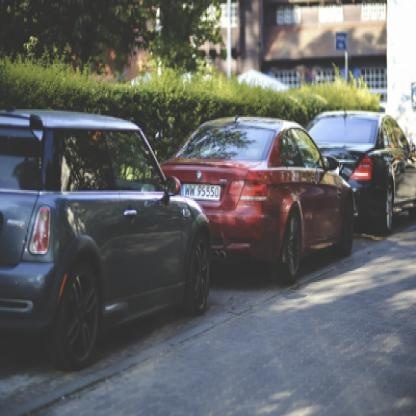

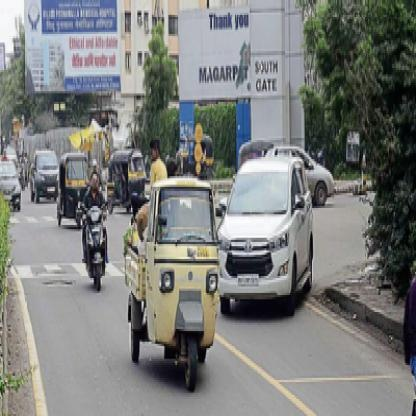

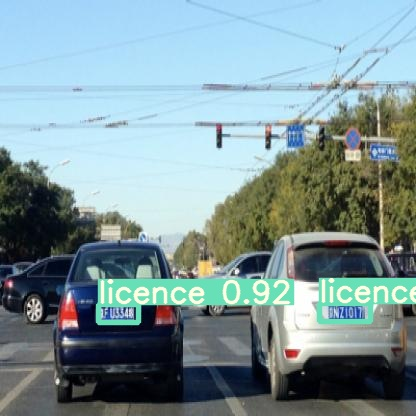

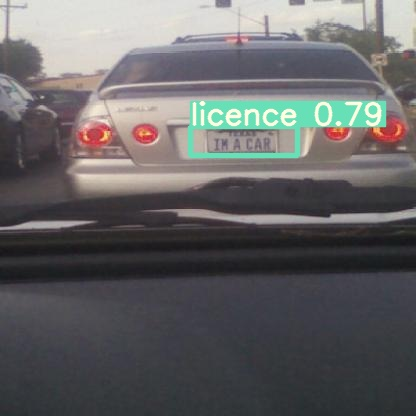

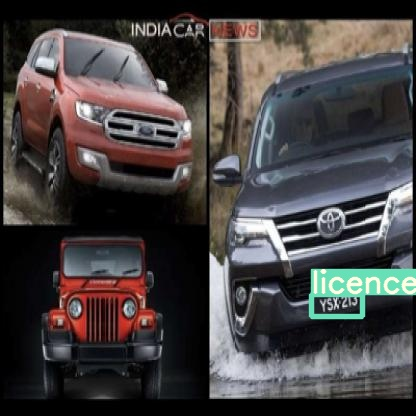

...

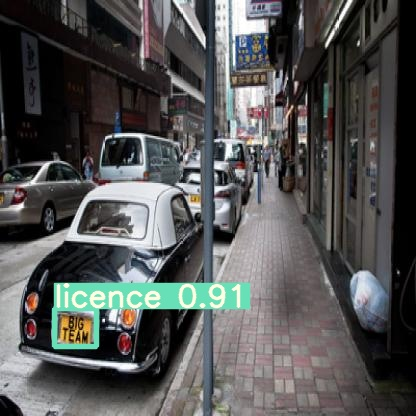

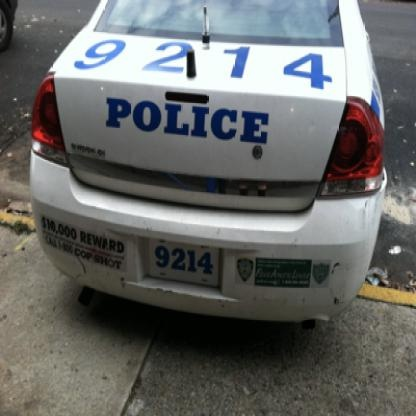

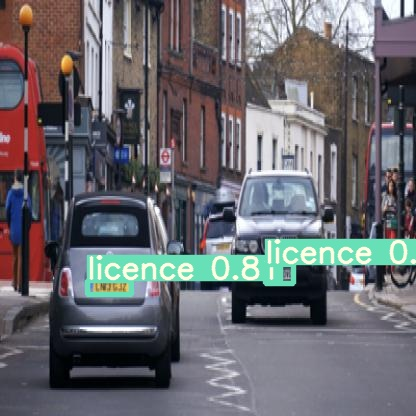

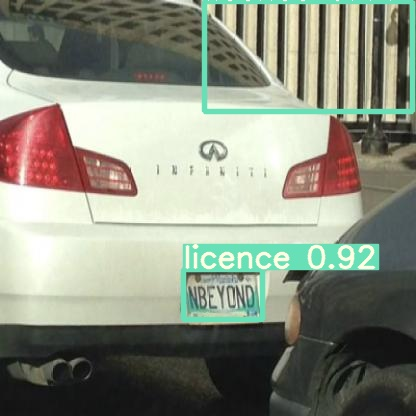

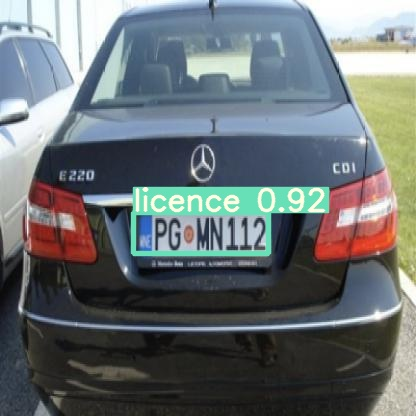

In [33]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('runs/detect/exp2/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [23]:


import glob
from IPython.display import Image, display

for imageName in glob.glob('test_images/results/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [38]:
!pip install pytesseract
# !sudo apt install tesseract-ocr
import pytesseract

Defaulting to user installation because normal site-packages is not writeable


In [48]:
%cd /home/bb/github/licence-plate-detection/yolov5

/home/bb/github/licence-plate-detection/yolov5


In [53]:
%ls test_images/results

Cars143_png.rf.05bb2eb0adc9ee3882901f96f073aa58.jpg
Cars166_png.rf.7ca5822faebc416fe1d320d7f0f21909.jpg
Cars17_png.rf.6c6578f8f88a03d2c66d614ae71045ee.jpg
Cars195_png.rf.01c0e3941d04845afd06aca7de5a6415.jpg
Cars236_png.rf.e275573af192a46bbd5e70784bfc4eb6.jpg
Cars273_png.rf.397d8e2ada05affd1c6b869c137bf29e.jpg
Cars288_png.rf.33ec9edbd717e9daf2fab9afd1a2d790.jpg
Cars289_png.rf.4767a78d971d346e65ec96f06004c0d0.jpg
Cars302_png.rf.dda6af03e656243fad9e34791b2c958d.jpg
Cars324_png.rf.c4a8cc4f10d261aae52aa7e63c4438c9.jpg
Cars345_png.rf.4d6ed2551182e09aa62665562e60d689.jpg
Cars36_png.rf.d4381c243ae0bd24a9ce84e7bea526a8.jpg
Cars370_png.rf.9dcca2183a0a62469381b68acf7839e6.jpg
Cars371_png.rf.b1a3a6fb56b052fd7b05defb9d03d583.jpg
Cars389_png.rf.88441199c3e3def4f2cda35328945b64.jpg
Cars395_png.rf.db240f49828484c462d9916baeb8104f.jpg
Cars401_png.rf.c3218948eafc00239312a736123308ac.jpg
Cars406_png.rf.521743f0321628312d9b1846e499f414.jpg
Cars432_png.rf.5d3591e828aff57fa3decfa3889d9deb.jpg
Cars50_png.rf.

In [60]:

text = pytesseract.image_to_string("test_images/results/Cars96_png.rf.bb03c472d120bd3e68bd088b66a56790.jpg")
print(text)

FPGolN11?



In [41]:
%matplotlib inline
def preprocess_licence_plate(image_path):
    # import the necessary packages
    import numpy as np
    #import argparse
    import cv2
    from opencv_jupyter_ui import cv2_imshow
    
    # convert the image to grayscale and flip the foreground
    # and background to ensure foreground is now "white" and
    # the background is "black"
    image= cv2.imread(image_path)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = cv2.bitwise_not(gray)
    cv2.imwrite('a.jpg',gray)
    return
    cv2.waitKey(0)

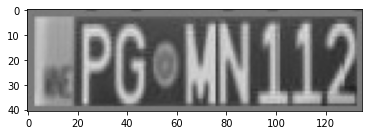

In [93]:
preprocess_licence_plate('test_images/results/Cars96_png.rf.bb03c472d120bd3e68bd088b66a56790.jpg')

In [44]:
import easyocr
import pytesseract
reader = easyocr.Reader(['en']) # this needs to run only once to load the model into memory
def read_text(img_path):
    display(Image(img_path))
    text = pytesseract.image_to_string(img_path)
    print('pytesseract',text)
    text = reader.readtext(img_path,detail=0)
    print('easyOCR',' '.join(text))
    

CUDA not available - defaulting to CPU. Note: This module is much faster with a GPU.


Progress: |██████████████████████████████████████████████████| 100.0% Complete

In [45]:
def compare_texts(img_path):
    read_text(img_path)
    preprocess_licence_plate(img_path)
    read_text('a.jpg')
    

pytesseract 1 Usse

easyOCR HS


pytesseract iy

easyOCR HWLL


pytesseract 
easyOCR Lcan


pytesseract 
easyOCR IRLAr


pytesseract YSKEW]

easyOCR YSkzi


pytesseract 
easyOCR NM


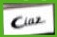

pytesseract 
easyOCR 


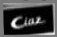

pytesseract 
easyOCR 


pytesseract 
easyOCR 


pytesseract 
easyOCR 


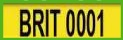

pytesseract 
easyOCR BRIT O001


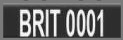

pytesseract BRIT 0001

easyOCR BRIT 0001


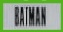

pytesseract LI

easyOCR IHMH


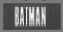

pytesseract L

easyOCR Ih


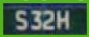

pytesseract SI2H

easyOCR 532h


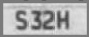

pytesseract 
easyOCR 5324


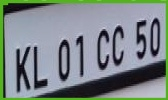

pytesseract Lo

easyOCR KLOLCCED 


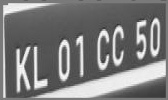

pytesseract L

easyOCR KLOICC5O 


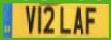

pytesseract 
easyOCR VIZLAF


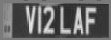

pytesseract 
easyOCR VIZLAF


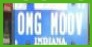

pytesseract 
easyOCR OHG TI0uu


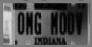

pytesseract 
easyOCR OHG [Du7


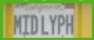

pytesseract 
easyOCR WidLyPH


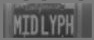

pytesseract 
easyOCR NidLYPH


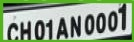

pytesseract s
‘o 01AN000T

easyOCR CHO L anooo]


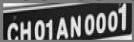

pytesseract 
easyOCR CHOI/ Anooo]]


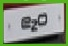

pytesseract 
easyOCR ez0


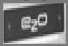

pytesseract 
easyOCR ep


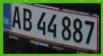

pytesseract 
easyOCR AB44887


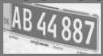

pytesseract 5.A§44s§7|

easyOCR AB 44887]


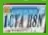

pytesseract TR

easyOCR 


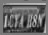

pytesseract 
easyOCR ILT8t


pytesseract HR 26 EC 5514

easyOCR HR 26 EC 5514


pytesseract HR 26 EC 5514

easyOCR HR 26 BC 5514


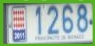

pytesseract 
easyOCR 7268


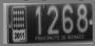

pytesseract 
easyOCR 1268


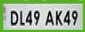

pytesseract DL49 AK49

easyOCR DL4P Ak4P


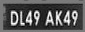

pytesseract 
easyOCR DL4P AK4P


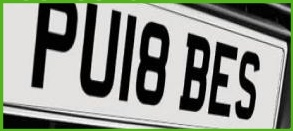

pytesseract PUIBBEs )

easyOCR BES PIIB


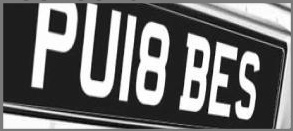

pytesseract W

easyOCR BES PUIe


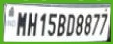

pytesseract NH 15808677

easyOCR HH15B0882]| 


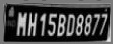

pytesseract * NN 15806877

easyOCR NHI5BD8877| 


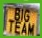

pytesseract 
easyOCR Fn


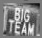

pytesseract 
easyOCR Tesa


pytesseract 
easyOCR 


pytesseract 
easyOCR 


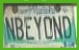

pytesseract AL
G YOND.

easyOCR NbEYOND 


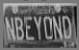

pytesseract 
easyOCR NbEYOND 


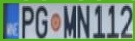

pytesseract FPGolN11?

easyOCR PGeVN112


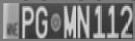

pytesseract 
easyOCR PC_HN112


In [47]:
for img_path in glob.glob('yolov5/test_images/results/*.jpg'):
    compare_texts(img_path)

conclusion with colors givers better results

In [55]:
#download version 4 of the dataset
for tun_img in glob.glob('/home/bb/tmp/detection/images/*.jpg'):
    !python detect_and_ocr.py --weights ../best.pt --img 416 --conf 0.4 --source {tun_img} --crop --view-img
    

Namespace(weights=['../best.pt'], source='/home/bb/tmp/detection/images/1.jpg', img_size=416, conf_thres=0.4, iou_thres=0.45, device='', view_img=True, save_txt=False, save_conf=False, classes=None, agnostic_nms=False, augment=False, update=False, project='runs/detect', name='exp', crop=True, exist_ok=False)
True
CUDA not available - defaulting to CPU. Note: This module is much faster with a GPU.
YOLOv5 v4.0-126-g886f1c0 torch 1.11.0+cu102 CPU

Fusing layers... 
Model Summary: 232 layers, 7246518 parameters, 0 gradients
/home/bb/.local/lib/python3.10/site-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
image 1/1 /home/bb/tmp/detection/images/1.jpg: 256x416 1 licence, Done. (0.115s)
test_images/results/1.jpg
easyOCR ['لآتالنننا']
Traceback (most recent call

Namespace(weights=['../best.pt'], source='/home/bb/tmp/detection/images/7.jpg', img_size=416, conf_thres=0.4, iou_thres=0.45, device='', view_img=True, save_txt=False, save_conf=False, classes=None, agnostic_nms=False, augment=False, update=False, project='runs/detect', name='exp', crop=True, exist_ok=False)
True
CUDA not available - defaulting to CPU. Note: This module is much faster with a GPU.
YOLOv5 v4.0-126-g886f1c0 torch 1.11.0+cu102 CPU

Fusing layers... 
Model Summary: 232 layers, 7246518 parameters, 0 gradients
/home/bb/.local/lib/python3.10/site-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
image 1/1 /home/bb/tmp/detection/images/7.jpg: 416x320 1 licence, Done. (0.136s)
test_images/results/7.jpg
easyOCR ['6803;`3759']
Traceback (most recent cal

True
CUDA not available - defaulting to CPU. Note: This module is much faster with a GPU.
YOLOv5 v4.0-126-g886f1c0 torch 1.11.0+cu102 CPU

Fusing layers... 
Model Summary: 232 layers, 7246518 parameters, 0 gradients
/home/bb/.local/lib/python3.10/site-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
image 1/1 /home/bb/tmp/detection/images/12.jpg: 256x416 1 licence, Done. (0.111s)
test_images/results/12.jpg
easyOCR ['87881 توسن14]']
Traceback (most recent call last):
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 214, in <module>
    detect()
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 158, in detect
    cv2.imshow(str(p), im0)
cv2.error: OpenCV(4.5.4) /tmp/pip-req-build-4x5kub8r/opencv/mod

/home/bb/.local/lib/python3.10/site-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
image 1/1 /home/bb/tmp/detection/images/17.jpg: 256x416 1 licence, Done. (0.116s)
test_images/results/17.jpg
easyOCR ['82', 'U5y', 'BLL|']
Traceback (most recent call last):
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 214, in <module>
    detect()
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 158, in detect
    cv2.imshow(str(p), im0)
cv2.error: OpenCV(4.5.4) /tmp/pip-req-build-4x5kub8r/opencv/modules/highgui/src/window.cpp:1274: error: (-2:Unspecified error) The function is not implemented. Rebuild the library with Windows, GTK+ 2.x or Cocoa support. If you are on Ubuntu or Debian, install libgtk2.0-dev 

Namespace(weights=['../best.pt'], source='/home/bb/tmp/detection/images/23.jpg', img_size=416, conf_thres=0.4, iou_thres=0.45, device='', view_img=True, save_txt=False, save_conf=False, classes=None, agnostic_nms=False, augment=False, update=False, project='runs/detect', name='exp', crop=True, exist_ok=False)
True
CUDA not available - defaulting to CPU. Note: This module is much faster with a GPU.
YOLOv5 v4.0-126-g886f1c0 torch 1.11.0+cu102 CPU

Fusing layers... 
Model Summary: 232 layers, 7246518 parameters, 0 gradients
/home/bb/.local/lib/python3.10/site-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
image 1/1 /home/bb/tmp/detection/images/23.jpg: 416x320 1 licence, Done. (0.139s)
test_images/results/23.jpg
easyOCR ['oL', '467']
Traceback (most recent c

True
CUDA not available - defaulting to CPU. Note: This module is much faster with a GPU.
YOLOv5 v4.0-126-g886f1c0 torch 1.11.0+cu102 CPU

Fusing layers... 
Model Summary: 232 layers, 7246518 parameters, 0 gradients
/home/bb/.local/lib/python3.10/site-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
image 1/1 /home/bb/tmp/detection/images/28.jpg: 256x416 1 licence, Done. (0.168s)
test_images/results/28.jpg
easyOCR ['179 > 7121']
Traceback (most recent call last):
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 214, in <module>
    detect()
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 158, in detect
    cv2.imshow(str(p), im0)
cv2.error: OpenCV(4.5.4) /tmp/pip-req-build-4x5kub8r/opencv/module

/home/bb/.local/lib/python3.10/site-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
image 1/1 /home/bb/tmp/detection/images/33.jpg: 288x416 1 licence, Done. (0.288s)
test_images/results/33.jpg
easyOCR ['77 35 286']
Traceback (most recent call last):
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 214, in <module>
    detect()
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 158, in detect
    cv2.imshow(str(p), im0)
cv2.error: OpenCV(4.5.4) /tmp/pip-req-build-4x5kub8r/opencv/modules/highgui/src/window.cpp:1274: error: (-2:Unspecified error) The function is not implemented. Rebuild the library with Windows, GTK+ 2.x or Cocoa support. If you are on Ubuntu or Debian, install libgtk2.0-dev and pkg-

  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 152
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 152
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 152
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 152
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 152
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 152
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 152
    print('easyOCR'
  

  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 152
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 152
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 152
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 152
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 152
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 152
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 152
    print('easyOCR'
  

  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 154
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 154
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 154
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 154
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 154
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 154
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 154
    print('easyOCR'
  

  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 154
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 154
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 152
    licence=arr[0]+arr[2]
    ^
IndentationError: expected an indented block after 'if' statement on line 151
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 152
    licence=arr[0]+arr[2]
    ^
IndentationError: expected an indented block after 'if' statement on line 151
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 152
    licence=arr[0]+arr[2]
    ^
IndentationError: expected an indented block after 'if' statement on line 151
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 152
    licence=arr[0]+arr[2]
    ^
Inde

  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
  

  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
  

  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
  

  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
  

  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 155
    print('easyOCR'
  

  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 158
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 158
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 158
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 158
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 158
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 158
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 158
    print('easyOCR'
  

  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 158
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 158
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 158
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 158
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 158
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 158
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 158
    print('easyOCR'
  

  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 158
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 158
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 158
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 158
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 158
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 158
    print('easyOCR'
         ^
SyntaxError: '(' was never closed
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 158
    print('easyOCR'
  

Namespace(weights=['../best.pt'], source='/home/bb/tmp/detection/images/689.jpg', img_size=416, conf_thres=0.4, iou_thres=0.45, device='', view_img=True, save_txt=False, save_conf=False, classes=None, agnostic_nms=False, augment=False, update=False, project='runs/detect', name='exp', crop=True, exist_ok=False)
True
CUDA not available - defaulting to CPU. Note: This module is much faster with a GPU.
YOLOv5 v4.0-126-g886f1c0 torch 1.11.0+cu102 CPU

Fusing layers... 
Model Summary: 232 layers, 7246518 parameters, 0 gradients
/home/bb/.local/lib/python3.10/site-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
image 1/1 /home/bb/tmp/detection/images/689.jpg: 416x256 1 licence, Done. (0.276s)
test_images/results/689.jpg
Traceback (most recent call last):
  File "

Namespace(weights=['../best.pt'], source='/home/bb/tmp/detection/images/695.jpg', img_size=416, conf_thres=0.4, iou_thres=0.45, device='', view_img=True, save_txt=False, save_conf=False, classes=None, agnostic_nms=False, augment=False, update=False, project='runs/detect', name='exp', crop=True, exist_ok=False)
True
CUDA not available - defaulting to CPU. Note: This module is much faster with a GPU.
YOLOv5 v4.0-126-g886f1c0 torch 1.11.0+cu102 CPU

Fusing layers... 
Model Summary: 232 layers, 7246518 parameters, 0 gradients
/home/bb/.local/lib/python3.10/site-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
image 1/1 /home/bb/tmp/detection/images/695.jpg: 416x288 1 licence, Done. (0.206s)
test_images/results/695.jpg
easyOCR 182$
Traceback (most recent call la

True
CUDA not available - defaulting to CPU. Note: This module is much faster with a GPU.
YOLOv5 v4.0-126-g886f1c0 torch 1.11.0+cu102 CPU

Fusing layers... 
Model Summary: 232 layers, 7246518 parameters, 0 gradients
/home/bb/.local/lib/python3.10/site-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
image 1/1 /home/bb/tmp/detection/images/700.jpg: 416x320 1 licence, Done. (0.176s)
test_images/results/700.jpg
easyOCR Mxs; 415L
Traceback (most recent call last):
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 223, in <module>
    detect()
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 167, in detect
    cv2.imshow(str(p), im0)
cv2.error: OpenCV(4.5.4) /tmp/pip-req-build-4x5kub8r/opencv/modules/h

/home/bb/.local/lib/python3.10/site-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
image 1/1 /home/bb/tmp/detection/images/705.jpg: 416x256 1 licence, Done. (0.247s)
test_images/results/705.jpg
easyOCR 0176* 5755
Traceback (most recent call last):
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 223, in <module>
    detect()
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 167, in detect
    cv2.imshow(str(p), im0)
cv2.error: OpenCV(4.5.4) /tmp/pip-req-build-4x5kub8r/opencv/modules/highgui/src/window.cpp:1274: error: (-2:Unspecified error) The function is not implemented. Rebuild the library with Windows, GTK+ 2.x or Cocoa support. If you are on Ubuntu or Debian, install libgtk2.0-dev and pkg-c

easyOCR [335L413]
Traceback (most recent call last):
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 223, in <module>
    detect()
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 167, in detect
    cv2.imshow(str(p), im0)
cv2.error: OpenCV(4.5.4) /tmp/pip-req-build-4x5kub8r/opencv/modules/highgui/src/window.cpp:1274: error: (-2:Unspecified error) The function is not implemented. Rebuild the library with Windows, GTK+ 2.x or Cocoa support. If you are on Ubuntu or Debian, install libgtk2.0-dev and pkg-config, then re-run cmake or configure script in function 'cvShowImage'

Namespace(weights=['../best.pt'], source='/home/bb/tmp/detection/images/711.jpg', img_size=416, conf_thres=0.4, iou_thres=0.45, device='', view_img=True, save_txt=False, save_conf=False, classes=None, agnostic_nms=False, augment=False, update=False, project='runs/detect', name='exp', crop=True, exist_ok=False)
True
CUDA not available - defaulting to CPU. N

Namespace(weights=['../best.pt'], source='/home/bb/tmp/detection/images/716.jpg', img_size=416, conf_thres=0.4, iou_thres=0.45, device='', view_img=True, save_txt=False, save_conf=False, classes=None, agnostic_nms=False, augment=False, update=False, project='runs/detect', name='exp', crop=True, exist_ok=False)
True
CUDA not available - defaulting to CPU. Note: This module is much faster with a GPU.
YOLOv5 v4.0-126-g886f1c0 torch 1.11.0+cu102 CPU

Fusing layers... 
Model Summary: 232 layers, 7246518 parameters, 0 gradients
/home/bb/.local/lib/python3.10/site-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
image 1/1 /home/bb/tmp/detection/images/716.jpg: 416x256 1 licence, Done. (0.368s)
test_images/results/716.jpg
easyOCR 99 Li3403
Traceback (most recent ca

True
CUDA not available - defaulting to CPU. Note: This module is much faster with a GPU.
YOLOv5 v4.0-126-g886f1c0 torch 1.11.0+cu102 CPU

Fusing layers... 
Model Summary: 232 layers, 7246518 parameters, 0 gradients
/home/bb/.local/lib/python3.10/site-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
image 1/1 /home/bb/tmp/detection/images/721.jpg: 416x256 1 licence, Done. (0.236s)
test_images/results/721.jpg

 L6d *470b50] 

Traceback (most recent call last):
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 225, in <module>
    detect()
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 169, in detect
    cv2.imshow(str(p), im0)
cv2.error: OpenCV(4.5.4) /tmp/pip-req-build-4x5kub8r/opencv/modules/hi

/home/bb/.local/lib/python3.10/site-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
image 1/1 /home/bb/tmp/detection/images/726.jpg: 320x416 1 licence, Done. (0.143s)
test_images/results/726.jpg

 1649053, 

Traceback (most recent call last):
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 225, in <module>
    detect()
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 169, in detect
    cv2.imshow(str(p), im0)
cv2.error: OpenCV(4.5.4) /tmp/pip-req-build-4x5kub8r/opencv/modules/highgui/src/window.cpp:1274: error: (-2:Unspecified error) The function is not implemented. Rebuild the library with Windows, GTK+ 2.x or Cocoa support. If you are on Ubuntu or Debian, install libgtk2.0-dev and pkg-config,


 1208*5620 

Traceback (most recent call last):
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 225, in <module>
    detect()
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 169, in detect
    cv2.imshow(str(p), im0)
cv2.error: OpenCV(4.5.4) /tmp/pip-req-build-4x5kub8r/opencv/modules/highgui/src/window.cpp:1274: error: (-2:Unspecified error) The function is not implemented. Rebuild the library with Windows, GTK+ 2.x or Cocoa support. If you are on Ubuntu or Debian, install libgtk2.0-dev and pkg-config, then re-run cmake or configure script in function 'cvShowImage'

Namespace(weights=['../best.pt'], source='/home/bb/tmp/detection/images/732.jpg', img_size=416, conf_thres=0.4, iou_thres=0.45, device='', view_img=True, save_txt=False, save_conf=False, classes=None, agnostic_nms=False, augment=False, update=False, project='runs/detect', name='exp', crop=True, exist_ok=False)
True
CUDA not available - defaulting to CPU. Note:

Namespace(weights=['../best.pt'], source='/home/bb/tmp/detection/images/737.jpg', img_size=416, conf_thres=0.4, iou_thres=0.45, device='', view_img=True, save_txt=False, save_conf=False, classes=None, agnostic_nms=False, augment=False, update=False, project='runs/detect', name='exp', crop=True, exist_ok=False)
True
CUDA not available - defaulting to CPU. Note: This module is much faster with a GPU.
YOLOv5 v4.0-126-g886f1c0 torch 1.11.0+cu102 CPU

Fusing layers... 
Model Summary: 232 layers, 7246518 parameters, 0 gradients
/home/bb/.local/lib/python3.10/site-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
image 1/1 /home/bb/tmp/detection/images/737.jpg: 416x256 1 licence, Done. (0.125s)
test_images/results/737.jpg

 1j33296/ 

Traceback (most recent call la


 16J321L6 

Traceback (most recent call last):
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 225, in <module>
    detect()
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 169, in detect
    cv2.imshow(str(p), im0)
cv2.error: OpenCV(4.5.4) /tmp/pip-req-build-4x5kub8r/opencv/modules/highgui/src/window.cpp:1274: error: (-2:Unspecified error) The function is not implemented. Rebuild the library with Windows, GTK+ 2.x or Cocoa support. If you are on Ubuntu or Debian, install libgtk2.0-dev and pkg-config, then re-run cmake or configure script in function 'cvShowImage'

Namespace(weights=['../best.pt'], source='/home/bb/tmp/detection/images/743.jpg', img_size=416, conf_thres=0.4, iou_thres=0.45, device='', view_img=True, save_txt=False, save_conf=False, classes=None, agnostic_nms=False, augment=False, update=False, project='runs/detect', name='exp', crop=True, exist_ok=False)
True
CUDA not available - defaulting to CPU. Note: 

Namespace(weights=['../best.pt'], source='/home/bb/tmp/detection/images/748.jpg', img_size=416, conf_thres=0.4, iou_thres=0.45, device='', view_img=True, save_txt=False, save_conf=False, classes=None, agnostic_nms=False, augment=False, update=False, project='runs/detect', name='exp', crop=True, exist_ok=False)
True
CUDA not available - defaulting to CPU. Note: This module is much faster with a GPU.
YOLOv5 v4.0-126-g886f1c0 torch 1.11.0+cu102 CPU

Fusing layers... 
Model Summary: 232 layers, 7246518 parameters, 0 gradients
/home/bb/.local/lib/python3.10/site-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
image 1/1 /home/bb/tmp/detection/images/748.jpg: 320x416 1 licence, Done. (0.262s)
test_images/results/748.jpg

 [09**5 6585 

Traceback (most recent call

True
CUDA not available - defaulting to CPU. Note: This module is much faster with a GPU.
YOLOv5 v4.0-126-g886f1c0 torch 1.11.0+cu102 CPU

Fusing layers... 
Model Summary: 232 layers, 7246518 parameters, 0 gradients
/home/bb/.local/lib/python3.10/site-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
image 1/1 /home/bb/tmp/detection/images/753.jpg: 320x416 1 licence, Done. (0.171s)
test_images/results/753.jpg

 7153 9433 

Traceback (most recent call last):
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 225, in <module>
    detect()
  File "/home/bb/github/licence-plate-detection/yolov5/detect_and_ocr.py", line 169, in detect
    cv2.imshow(str(p), im0)
cv2.error: OpenCV(4.5.4) /tmp/pip-req-build-4x5kub8r/opencv/modules/highg


KeyboardInterrupt



In [53]:
filepath='/home/bb/tmp/license_plates_detection_train/29.jpg'
%cd yolov5
!python detect_and_ocr.py --weights ../best.pt --img 416 --conf 0.4 --source {filepath} --crop

[Errno 2] No such file or directory: 'yolov5'
/home/bb/github/licence-plate-detection/yolov5
Namespace(weights=['../best.pt'], source='/home/bb/tmp/license_plates_detection_train/29.jpg', img_size=416, conf_thres=0.4, iou_thres=0.45, device='', view_img=False, save_txt=False, save_conf=False, classes=None, agnostic_nms=False, augment=False, update=False, project='runs/detect', name='exp', crop=True, exist_ok=False)
True
CUDA not available - defaulting to CPU. Note: This module is much faster with a GPU.
YOLOv5 v4.0-126-g886f1c0 torch 1.11.0+cu102 CPU

Fusing layers... 
Model Summary: 232 layers, 7246518 parameters, 0 gradients
/home/bb/.local/lib/python3.10/site-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
image 1/1 /home/bb/tmp/license_plates_detection

['P30|N112']

In [5]:
result = reader.readtext('yolov5/a.jpg',detail=0)
result

['PGo|NII2']

# Export Trained Weights for Future Inference

Now that you have trained your custom detector, you can export the trained weights you have made here for inference on your device elsewhere

In [23]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [24]:
%mkdir /content/gdrive/My\ Drive/licence_plates

In [26]:
%cp /content/yolov5/runs/train/yolov5s_results2/weights/best.pt /content/gdrive/My\ Drive/licence_plates/

## Congrats!

Hope you enjoyed this!

--Team [Roboflow](https://roboflow.ai)